## Import

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import pickle as pk
from scipy.stats import binom
from scipy.stats import poisson
from scipy.stats import expon
from scipy import stats

In [2]:
def get_KL(v1, v2, is_P=0):
    if is_P == 0:
        v1 = np.array(v1)
        v2 = np.array(v2)
        p_v1 = v1 / sum(v1)
        p_v2 = v2 / sum(v2)
    else:
        p_v1 = v1
        p_v2 = v2
    KL = 0
    for i in range(len(v1)):
        if p_v1[i] > 0 and p_v2[i] > 0:
            KL += p_v1[i] * np.log2(p_v1[i] / p_v2[i])
    return KL


def get_JS(v1, v2, w1=0.5, w2=0.5):
    v1 = np.array(v1)
    v2 = np.array(v2)

    p_v1 = v1 / sum(v1)
    p_v2 = v2 / sum(v2)
    p_avg = (p_v1 + p_v2) / 2
    JS = w1 * get_KL(p_v1, p_avg, 1) + w2 * get_KL(p_v2, p_avg, 1)
    return JS

In [3]:
def get_the_int(p1,p2,N_all,x,N_c):
    res_p = 0
    for i in range(N_c):
        p_c = binom.pmf(i,N_c,p1)
        p_s = binom.pmf(x-i,N_all-N_c,p2)
        res_p += p_c * p_s
    return res_p

def find_best_p(N_all, N_c, y_real):
    best_p1 = 0
    best_p2 = 0
    best_pears = 0
    final_y = []
    for p1 in np.arange(0,0.51,0.01):
        for p2 in np.arange(0,0.51,0.01):
            y_the =[]
            for x in range(N_all+1):
                tmp_y = get_the_int(p1, p2, N_all, x, N_c)
                y_the.append(tmp_y)
            pear_s,_ = stats.pearsonr(y_real,y_the)
            if pear_s > best_pears:
                best_pears = pear_s
                best_p1 = p1
                best_p2 = p2
                final_y = y_the
    print('p1 and p2:',best_p1,best_p2,'best pearson:',best_pears)
    return best_p1, best_p2, best_pears,final_y

def get_pear(p1,p2,N_all, N_c, y_real):
    y_the =[]
    for x in range(N_all+1):
        tmp_y = get_the_int(p1, p2, N_all, x, N_c)
        y_the.append(tmp_y)
    pear_s,_ = stats.pearsonr(y_real,y_the)
    return pear_s,y_the


In [4]:
## Luna
df = pd.read_excel('data/HNa_Luna.xlsx')
df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,peak,ismax
0,575.96677,2.511517e+08,2,2,0,"dA[1,2,0,6]",5,8,2,6,2,1
1,549.31506,2.426680e+08,3,3,0,"dA[2,3,0,8]",23,11,3,8,9,1
2,586.95594,2.141609e+08,2,3,1,"dA[1,2,0,6]",5,8,2,6,2,0
3,543.31140,1.928044e+08,3,3,0,"dA[2,2,0,8]aG",20,11,3,8,8,1
4,549.31449,1.891836e+08,3,3,0,"dA[2,3,0,8]",26,11,3,8,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...
170,547.98014,1.320641e+05,3,9,6,"dA[2,2,1,6]aG",19,9,3,6,6,0
171,559.95562,7.984292e+04,2,5,3,"dA[1,1,0,5]aG",11,7,2,5,3,0
172,559.95504,6.553285e+04,2,5,3,"dA[1,1,0,5]aG",16,7,2,5,4,0
173,570.96285,5.565086e+04,2,6,4,"dA[1,1,0,5]aG",16,7,2,5,4,0


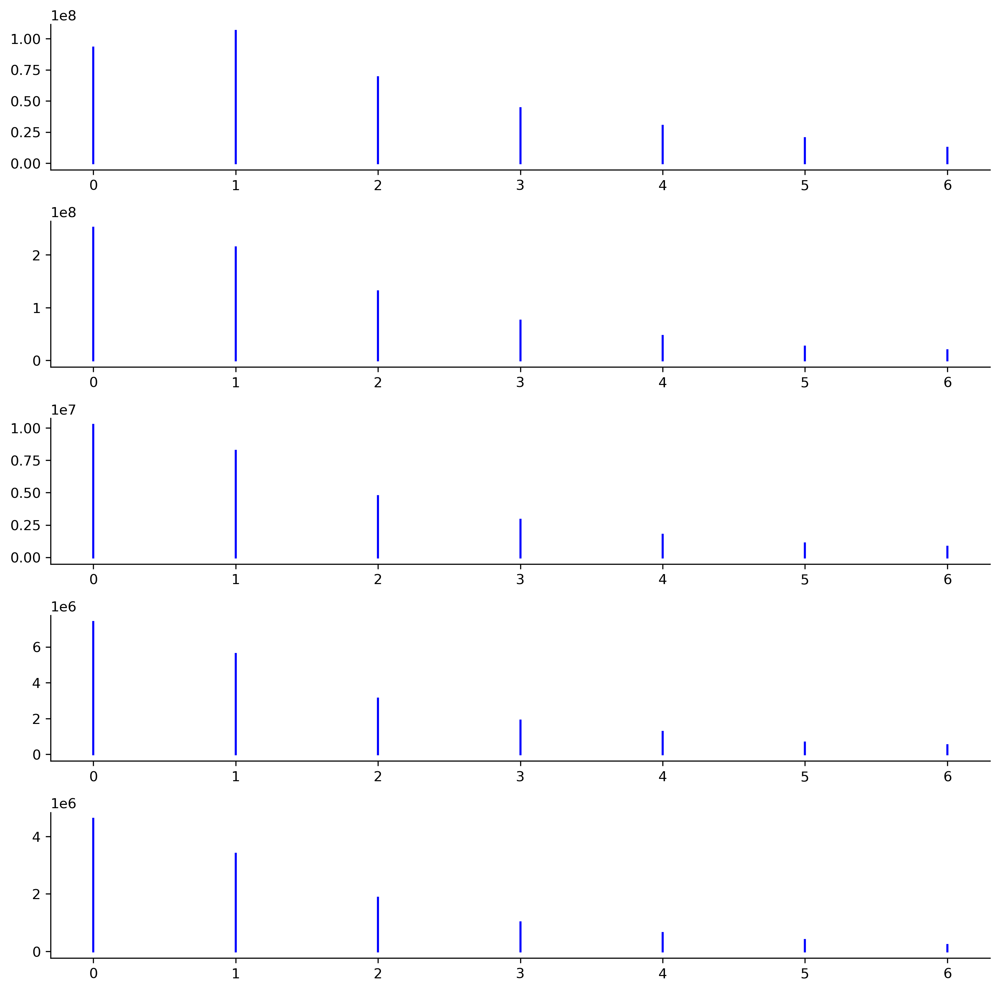

In [7]:
group = df_1.num.unique()
fig, axs = plt.subplots(5,1,figsize=(10, 10),dpi=300)
count = 0
for n in group:
    tmp_df = df_1[df_1['num']==n]
    y = np.array(tmp_df['inten'])
    for i in range(len(y)):
        axs[count].plot([i,i],[0,y[i]], color='b')
    count+=1
sns.despine()
plt.tight_layout(pad=1) 
plt.show()

In [5]:
 df['weight'] = df['inten']*df['Na']
 df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,peak,ismax,weight
0,575.96677,2.511517e+08,2,2,0,"dA[1,2,0,6]",5,8,2,6,2,1,0.000000e+00
1,549.31506,2.426680e+08,3,3,0,"dA[2,3,0,8]",23,11,3,8,9,1,0.000000e+00
2,586.95594,2.141609e+08,2,3,1,"dA[1,2,0,6]",5,8,2,6,2,0,2.141609e+08
3,543.31140,1.928044e+08,3,3,0,"dA[2,2,0,8]aG",20,11,3,8,8,1,0.000000e+00
4,549.31449,1.891836e+08,3,3,0,"dA[2,3,0,8]",26,11,3,8,10,1,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,547.98014,1.320641e+05,3,9,6,"dA[2,2,1,6]aG",19,9,3,6,6,0,7.923846e+05
171,559.95562,7.984292e+04,2,5,3,"dA[1,1,0,5]aG",11,7,2,5,3,0,2.395288e+05
172,559.95504,6.553285e+04,2,5,3,"dA[1,1,0,5]aG",16,7,2,5,4,0,1.965985e+05
173,570.96285,5.565086e+04,2,6,4,"dA[1,1,0,5]aG",16,7,2,5,4,0,2.226034e+05


In [6]:
group = df.group.unique()
group

array([ 5, 23, 20, 26, 25, 21,  1, 22, 24,  2,  6,  3,  8, 13, 12,  7,  9,
       17, 19, 14,  4, 15, 18, 10, 11, 16])

In [16]:
## SO3H fit 
fig, axs = plt.subplots(6,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['group']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'S_Na']
    com = tmp_df.loc[0,'com']
    p = sum(tmp_df['weight'])/(sum(tmp_df['inten'])*lim)

    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
            tmp_the = binom.pmf(tmp_x, lim, p)
            y_the.append(tmp_the)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
            tmp_the = binom.pmf(tmp_x, lim, p)
            y_the.append(tmp_the)
    # for i in tmp_df.index:
    #     tmp_x = tmp_df.loc[i,'Na']
    #     tmp_real = tmp_df.loc[i,'inten']
    #     tmp_the = binom.pmf(tmp_x, lim, p)
    #     y_real.append(tmp_real)
    #     y_the.append(tmp_the)
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pearson='+str(tmp_per)+', p='+str(np.round(p,5)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

In [8]:
p

14.327856931185481

In [11]:
lim

8

In [7]:
### binomial distribution for two distribution
fig, axs = plt.subplots(7,4,figsize=(30, 30),dpi=300)
p_result = []
for n in group:
    tmp_df = df[df['group']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    N_c = tmp_df.loc[0,'C_Na']
    com = tmp_df.loc[0,'com']
    scan = tmp_df.loc[0,'peak']
    is_max = np.max(tmp_df.loc[:,'ismax'])
    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
    p1,p2,pears,y_the = find_best_p(lim, N_c, y_real)
    if is_max>=1:
        p_result.append([p1,'p1',scan])
        p_result.append([p2,'p2',scan])
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pearson='+str(tmp_per)+', p1='+str(np.round(p1,2))+', p2='+str(np.round(p2,2)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

p1 and p2: 0.08 0.12 best pearson: 0.975732149232732
p1 and p2: 0.02 0.04 best pearson: 0.9972673074977295
p1 and p2: 0.04 0.04 best pearson: 0.995315357161004
p1 and p2: 0.03 0.04 best pearson: 0.9981760062962285
p1 and p2: 0.05 0.06 best pearson: 0.9986886988861878
p1 and p2: 0.02 0.04 best pearson: 0.9961445752435173
p1 and p2: 0.1 0.16 best pearson: 0.9673271509569646
p1 and p2: 0.03 0.05 best pearson: 0.9971401504318701
p1 and p2: 0.01 0.04 best pearson: 0.9989332122599612
p1 and p2: 0.07 0.15 best pearson: 0.9631459312711522
p1 and p2: 0.05 0.11 best pearson: 0.9834648609672014
p1 and p2: 0.06 0.12 best pearson: 0.9679033106414046
p1 and p2: 0.05 0.12 best pearson: 0.9763992531082644
p1 and p2: 0.05 0.08 best pearson: 0.9824317554210845
p1 and p2: 0.05 0.11 best pearson: 0.9778658408701186
p1 and p2: 0.06 0.11 best pearson: 0.9754381179916213
p1 and p2: 0.05 0.12 best pearson: 0.9749276756877058
p1 and p2: 0.07 0.1 best pearson: 0.9824133426829822
p1 and p2: 0.04 0.03 best pearso

In [8]:
p_df = pd.DataFrame(p_result,columns=['value','type','peak'])
p_df

,value,type,peak
0,0.08,p1,2
1,0.12,p2,2
2,0.02,p1,9
3,0.04,p2,9
4,0.04,p1,8
5,0.04,p2,8
6,0.03,p1,10
7,0.04,p2,10
8,0.10,p1,1
9,0.16,p2,1


In [9]:
p_df = p_df.sort_values(by='peak')
p_df

,value,type,peak
8,0.10,p1,1
9,0.16,p2,1
0,0.08,p1,2
1,0.12,p2,2
10,0.05,p1,3
11,0.12,p2,3
12,0.05,p1,4
13,0.08,p2,4
14,0.07,p1,5
15,0.10,p2,5


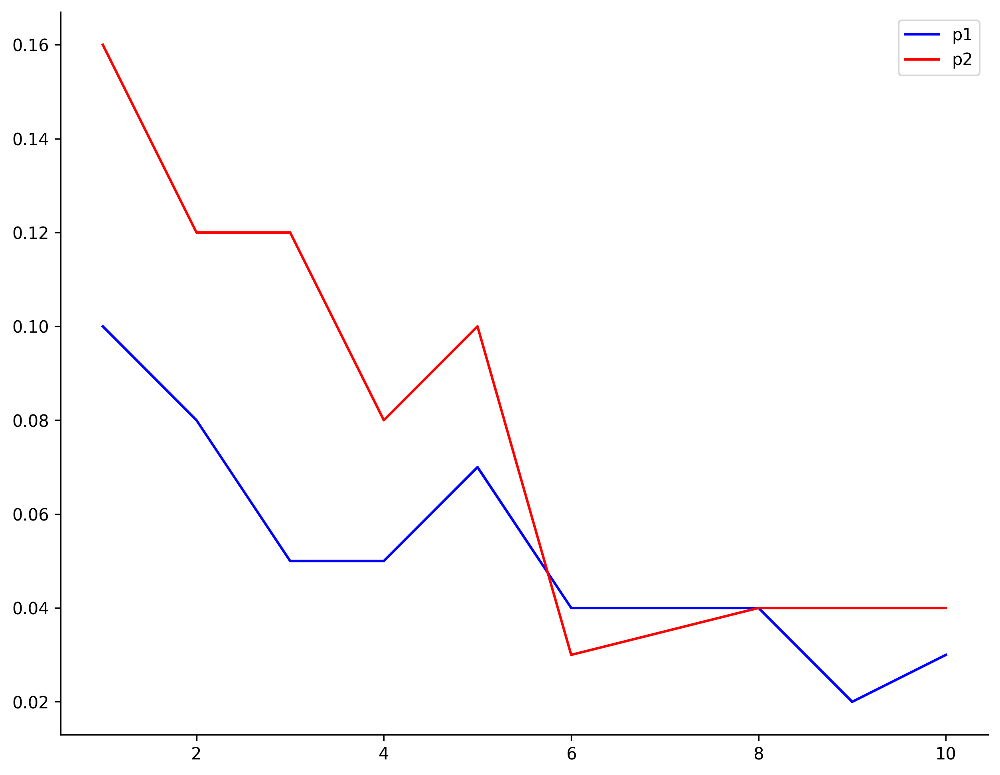

In [11]:
plt.figure(figsize=(10, 8),dpi=300)
ddf = p_df
# sns.boxplot(x='peak',y='value',data=ddf, hue='type')
# sns.stripplot(x='peak',y='value',hue='type',jitter=True,data=ddf,color='.25',dodge=True)
# sns.swarmplot(x='peak',y='value',hue='type',data=ddf,dodge=True)
ddf1 = ddf[ddf['type']=='p1']
ddf2 = ddf[ddf['type']=='p2']
plt.plot(ddf1['peak'],ddf1['value'],color='b',label='p1')
plt.plot(ddf2['peak'],ddf2['value'],color='r',label='p2')
plt.legend()
sns.despine()
# plt.ylim(0,300000)
# plt.xlim(0,30)
plt.show()

In [25]:
### get one best p
### binomial distribution for two distribution 
best_pears = 0
best_p1 = 0
best_p2 = 0
for p1 in np.arange(0,0.51,0.01):
    for p2 in np.arange(0,0.51,0.01):
        one_pear = 0
        for n in group:
            tmp_df = df[df['group']==n]
            tmp_df.index = range(tmp_df.shape[0])
            x = np.array(tmp_df['Na'])
            lim = tmp_df.loc[0,'limit']
            N_c = tmp_df.loc[0,'C_Na']
            com = tmp_df.loc[0,'com']
            scan = tmp_df.loc[0,'peak']
            y_real = []
            y_the = []
            Na_uni = tmp_df['Na'].unique()
            for i in range(lim+1):
                tmp_x = i
                if i not in Na_uni:
                    y_real.append(0)
                else:
                    tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
                    y_real.append(tmp_real)
            pears,y_the = get_pear(p1,p2,lim, N_c, y_real)
            one_pear += pears
        if one_pear > best_pears:
            best_pears = one_pear
            best_p1 = p1
            best_p2 = p2
            print('updata p1 and p2, the new pearson is ',best_pears/len(group))

fig, axs = plt.subplots(7,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['group']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    N_c = tmp_df.loc[0,'C_Na']
    com = tmp_df.loc[0,'com']
    scan = tmp_df.loc[0,'peak']
    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
    pears,y_the = get_pear(best_p1,best_p2,lim, N_c, y_real)
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    # tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pearson='+str(tmp_per)+', p1='+str(np.round(best_p1,2))+', p2='+str(np.round(best_p2,2)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

updata p1 and p2, the new pearson is  19.969136023899914
updata p1 and p2, the new pearson is  20.69834399732132
updata p1 and p2, the new pearson is  21.37971735258225
updata p1 and p2, the new pearson is  22.00230577169803
updata p1 and p2, the new pearson is  22.55658170568958
updata p1 and p2, the new pearson is  23.034928722892534
updata p1 and p2, the new pearson is  23.43192110294933
updata p1 and p2, the new pearson is  23.744377420255567
updata p1 and p2, the new pearson is  23.971218037103927
updata p1 and p2, the new pearson is  24.113186608977628
updata p1 and p2, the new pearson is  24.17250344004206
updata p1 and p2, the new pearson is  24.18192457876075
updata p1 and p2, the new pearson is  24.187792605892028
updata p1 and p2, the new pearson is  24.19130984658802


In [20]:
df

,value,type,peak
0,0.10,p1,1
1,0.16,p2,1
2,0.07,p1,1
3,0.15,p2,1
4,0.06,p1,1
5,0.12,p2,1
6,0.13,p1,1
7,0.24,p2,1
8,0.08,p1,2
9,0.12,p2,2


In [14]:
### binomial distribution 
fig, axs = plt.subplots(6,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['num']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    com = tmp_df.loc[0,'com']
    p = sum(tmp_df['weight'])/(sum(tmp_df['inten'])*lim)

    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
            tmp_the = binom.pmf(tmp_x, lim, p)
            y_the.append(tmp_the)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
            tmp_the = binom.pmf(tmp_x, lim, p)
            y_the.append(tmp_the)
    # for i in tmp_df.index:
    #     tmp_x = tmp_df.loc[i,'Na']
    #     tmp_real = tmp_df.loc[i,'inten']
    #     tmp_the = binom.pmf(tmp_x, lim, p)
    #     y_real.append(tmp_real)
    #     y_the.append(tmp_the)
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pearson='+str(tmp_per)+', p='+str(np.round(p,5)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

In [85]:
## possion distribution
fig, axs = plt.subplots(6,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['num']==n]
    tmp_df.index = range(tmp_df.shape[0])
    lambd = sum(tmp_df['weight'])/sum(tmp_df['inten'])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    com = tmp_df.loc[0,'com']
    y_real = []
    y_the = []
    for i in tmp_df.index:
        tmp_x = tmp_df.loc[i,'Na']
        tmp_real = tmp_df.loc[i,'inten']
        tmp_the = poisson.pmf(tmp_x,lambd)
        y_real.append(tmp_real)
        y_the.append(tmp_the)
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),5)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(len(x)):
        xx = x[i]
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([min(x)-1,max(x)+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', JS='+str(tmp_per)+', lambda='+str(np.round(lambd,5)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()


In [ ]:
a1

In [86]:
fig, axs = plt.subplots(6,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['num']==n]
    tmp_df.index = range(tmp_df.shape[0])
    lambd = sum(tmp_df['weight'])/sum(tmp_df['inten'])
    # print(lambd)
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    com = tmp_df.loc[0,'com']
    y_real = []
    y_the = []
    for i in tmp_df.index:
        tmp_x = tmp_df.loc[i,'Na']
        tmp_real = tmp_df.loc[i,'inten']
        tmp_the = expon.pdf(tmp_x,loc=min(x),scale=lambd)
        y_real.append(tmp_real)
        y_the.append(tmp_the)
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    tmp_per = np.round(stats.pearsonr(y_real,y_the),5)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(len(x)):
        xx = x[i]
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([min(x)-1,max(x)+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', JS='+str(tmp_per)+', lambda='+str(np.round(lambd,5)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

In [47]:
expon.pdf(0.01,scale=1/2)

1.9603973466135105

In [55]:
tmpi

array([0.00000000e+00, 8.17775726e-05, 3.84521484e-03, 3.04162502e-02,
       1.09375000e-01, 2.34693289e-01, 3.11462402e-01])

In [69]:
p

array([0.   , 0.125, 0.25 , 0.375, 0.5  , 0.625, 0.75 ])

In [84]:
fig, axs = plt.subplots(6,4,figsize=(30, 30),dpi=300)
for n in group:
    tmp_df = df[df['num']==n]
    tmp_df.index = range(tmp_df.shape[0])
    lambd = sum(tmp_df['weight'])/sum(tmp_df['inten'])
    # print(lambd)
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    com = tmp_df.loc[0,'com']
    y_real = []
    y_the = []
    for i in tmp_df.index:
        tmp_x = tmp_df.loc[i,'Na']
        tmp_real = tmp_df.loc[i,'inten']
        y_real.append(tmp_real)
    N = np.sum(y_real)*lim
    p = np.sum(tmp_df['weight'])/N

    for n_na in x:
        tmpi =binom.pmf(n_na,lim,p)
        y_the.append(tmpi)
    
    y_real =np.array(y_real)/y_real[0]*100
    y_the = np.array(y_the)/y_the[0]*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//4
    a2 = (n-1)%4
    for i in range(len(x)):
        xx = x[i]
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([min(x)-1,max(x)+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+',lim='+str(lim)+', JS='+str(tmp_JS)+', p='+str(np.round(p,5)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=2) 
plt.show()

In [78]:
p

20.016093895517084

In [82]:
np.sum(tmp_real)*lim

2842079.82421875

In [83]:
np.sum(tmp_df['weight'])

56887336.62011719

## Luna_XBridge dp4-6 result

In [3]:
df = pd.read_excel('data/LX_dp4_6_count.xlsx')
df

,components,score,-log_p_adj,peak,dp,LC
0,"dA[1,2,0,6]",87.28,31.41,1,4,L
1,"dA[1,2,0,5]",64.51,16.05,1,4,L
2,"dA[1,2,0,4]",19.59,13.06,1,4,L
3,"dA[1,1,0,5]aG",10.22,16.05,1,4,L
4,"dA[1,2,1,5]",8.40,4.76,1,4,L
...,...,...,...,...,...,...
386,"dA[2,2,2,6]aG",10.86,9.90,27,6,X
387,"dA[2,3,1,8]",9.70,14.72,27,6,X
388,"dA[2,3,3,8]",5.94,8.83,27,6,X
389,"dA[2,2,1,8]aG",5.61,6.63,27,6,X


In [5]:
df['peak'] = df['peak'].astype('str')
df['peakname'] = df['LC']+df['peak']
df

,components,score,-log_p_adj,peak,dp,LC,peakname
0,"dA[1,2,0,6]",87.28,31.41,1,4,L,L1
1,"dA[1,2,0,5]",64.51,16.05,1,4,L,L1
2,"dA[1,2,0,4]",19.59,13.06,1,4,L,L1
3,"dA[1,1,0,5]aG",10.22,16.05,1,4,L,L1
4,"dA[1,2,1,5]",8.40,4.76,1,4,L,L1
...,...,...,...,...,...,...,...
386,"dA[2,2,2,6]aG",10.86,9.90,27,6,X,X27
387,"dA[2,3,1,8]",9.70,14.72,27,6,X,X27
388,"dA[2,3,3,8]",5.94,8.83,27,6,X,X27
389,"dA[2,2,1,8]aG",5.61,6.63,27,6,X,X27


In [6]:
col_name = df['components'].unique()
row_name = df['peakname'].unique()

In [7]:
res = []
for i in range(len(row_name)):
    one_row= []
    tmp_pn = row_name[i]
    tmp_df = df[df['peakname']==tmp_pn]
    tmp_dp = np.array(tmp_df['dp'])[0]
    tmp_lc = np.array(tmp_df['LC'])[0]
    one_row.extend([tmp_pn,tmp_dp,tmp_lc])
    for j in range(len(col_name)):
        tmp_cn = col_name[j]
        if tmp_cn in np.array(tmp_df['components']):
            padj = np.array(tmp_df[tmp_df['components']==tmp_cn]['-log_p_adj'])[0]
            one_row.append(padj)
        else:
            one_row.append(np.nan)
    res.append(one_row)
res_df=pd.DataFrame(res)
tmp_col =['peak','dp','LC']
tmp_col.extend(col_name)
res_df.columns=tmp_col
res_df
    

,peak,dp,LC,"dA[1,2,0,6]","dA[1,2,0,5]","dA[1,2,0,4]","dA[1,1,0,5]aG","dA[1,2,1,5]","dA[1,1,1,4]aG","dA[1,2,0,7]",...,"dA[2,2,2,5]aG","dA[2,3,1,1]","dA[2,3,2,9]","dA[2,3,3,8]","dA[2,3,3,4]","dA[2,3,3,5]","dA[2,3,3,6]","dA[2,3,2,5]","dA[2,3,1,4]","dA[2,2,2,4]aG"
0,L1,4,L,31.41,16.05,13.06,16.05,4.76,4.41,2.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,L2,4,L,26.83,16.31,11.00,7.37,NaN,NaN,3.74,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,L3,4,L,28.09,49.22,49.22,16.33,8.88,NaN,4.10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,L4,4,L,24.23,49.00,9.73,16.53,12.04,NaN,6.63,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,L5,4,L,24.13,49.10,13.37,2.74,12.59,NaN,4.17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,X1,4,X,NaN,7.48,4.45,7.30,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,X2,4,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,X3,4,X,NaN,NaN,10.78,7.25,2.24,2.36,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,X4,4,X,NaN,4.39,13.48,15.39,NaN,10.39,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,X5,4,X,NaN,NaN,4.86,9.34,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
res_df.to_csv('data/LX_dp4_dp6_ht.csv',index=None)

In [10]:
86*3+86+(85+85+82+91)*3+85+85*2+85+87*3+74*3

2196

In [11]:
3+1+12+1+3+6

26

In [12]:
2196/26

84.46153846153847

## Luna dp4-dp10 absolute intensity 

In [4]:
df = pd.read_excel('data/HNa_Luna_4_10.xlsx')
df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,scan,ismax
0,575.96602,9.285062e+07,2,2,0,"dA[1,2,0,6]",1,8,2,6,18.076,1
1,586.95628,1.062081e+08,2,3,1,"dA[1,2,0,6]",1,8,2,6,18.076,1
2,597.94706,6.898725e+07,2,4,2,"dA[1,2,0,6]",1,8,2,6,18.076,1
3,608.93831,4.418838e+07,2,5,3,"dA[1,2,0,6]",1,8,2,6,18.076,1
4,619.92924,2.997720e+07,2,6,4,"dA[1,2,0,6]",1,8,2,6,18.076,1
...,...,...,...,...,...,...,...,...,...,...,...,...
747,651.75748,1.119407e+06,4,7,3,"[5,5,1,10]",117,15,5,10,24.982,0
748,679.25897,1.666865e+06,4,12,8,"[5,5,1,10]",117,15,5,10,24.982,0
749,684.74214,3.812812e+06,4,13,9,"[5,5,1,10]",117,15,5,10,24.982,0
750,690.23991,6.945432e+05,4,14,10,"[5,5,1,10]",117,15,5,10,24.982,0


In [5]:
 df['weight'] = df['inten']*df['Na']
 df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,scan,ismax,weight
0,575.96602,9.285062e+07,2,2,0,"dA[1,2,0,6]",1,8,2,6,18.076,1,0.000000e+00
1,586.95628,1.062081e+08,2,3,1,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.062081e+08
2,597.94706,6.898725e+07,2,4,2,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.379745e+08
3,608.93831,4.418838e+07,2,5,3,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.325651e+08
4,619.92924,2.997720e+07,2,6,4,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.199088e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...
747,651.75748,1.119407e+06,4,7,3,"[5,5,1,10]",117,15,5,10,24.982,0,3.358220e+06
748,679.25897,1.666865e+06,4,12,8,"[5,5,1,10]",117,15,5,10,24.982,0,1.333492e+07
749,684.74214,3.812812e+06,4,13,9,"[5,5,1,10]",117,15,5,10,24.982,0,3.431531e+07
750,690.23991,6.945432e+05,4,14,10,"[5,5,1,10]",117,15,5,10,24.982,0,6.945432e+06


In [6]:
group = df.group.unique()
group

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117],
      dtype=int64)

In [10]:
y_real

array([nan, inf, inf, inf, inf, inf, nan, nan])

In [12]:
tmp_df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,scan,ismax,weight
0,576.96491,3.890574e+07,2,3,1,"[2,2,1,5]",3,7,2,5,18.076,0,3.890574e+07
1,587.95467,3.976426e+07,2,4,2,"[2,2,1,5]",3,7,2,5,18.076,0,7.952852e+07
2,598.94658,2.564759e+07,2,5,3,"[2,2,1,5]",3,7,2,5,18.076,0,7.694276e+07
3,609.93750,1.559089e+07,2,6,4,"[2,2,1,5]",3,7,2,5,18.076,0,6.236355e+07
4,620.92843,1.110731e+07,2,7,5,"[2,2,1,5]",3,7,2,5,18.076,0,5.553655e+07


In [19]:
### binomial distribution for two distribution
fig, axs = plt.subplots(24,5,figsize=(20, 60),dpi=300)
p_result = []
for n in group:
    tmp_df = df[df['group']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    N_c = tmp_df.loc[0,'C_Na']
    com = tmp_df.loc[0,'com']
    scan = tmp_df.loc[0,'scan']
    is_max = np.max(tmp_df.loc[:,'ismax'])
    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
    p1,p2,pears,y_the = find_best_p(lim, N_c, y_real)
    if is_max>=1:
        p_result.append([p1,'p1',scan])
        p_result.append([p2,'p2',scan])
    max_real = np.max(y_real)
    max_the = np.max(y_the)
    y_real =np.array(y_real)/max_real*100
    y_the = np.array(y_the)/max_the*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    # tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//5
    a2 = (n-1)%5
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pc='+str(np.round(pears,3))+', p1,p2='+str(np.round(p1,2))+', '+str(np.round(p2,2)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=0.9) 
plt.show()

p1 and p2: 0.1 0.16 best pearson: 0.9673271509569646
p1 and p2: 0.07 0.15 best pearson: 0.9631459312711522
p1 and p2: 0.5 0.27 best pearson: 0.9376985293867961
p1 and p2: 0.5 0.29 best pearson: 0.9437837853319146
p1 and p2: 0.06 0.12 best pearson: 0.9679033106414042
p1 and p2: 0.08 0.12 best pearson: 0.975732149232732
p1 and p2: 0.5 0.23 best pearson: 0.9255037746272898
p1 and p2: 0.05 0.11 best pearson: 0.9834648609672019
p1 and p2: 0.08 0.14 best pearson: 0.9735401220494478
p1 and p2: 0.05 0.12 best pearson: 0.9763992531082644
p1 and p2: 0.05 0.12 best pearson: 0.964919898361138
p1 and p2: 0.03 0.07 best pearson: 0.9591914804232415
p1 and p2: 0.05 0.12 best pearson: 0.9749276756877058
p1 and p2: 0.5 0.23 best pearson: 0.9276854380064052
p1 and p2: 0.06 0.12 best pearson: 0.956050085428613
p1 and p2: 0.05 0.13 best pearson: 0.9793255870670005
p1 and p2: 0.06 0.1 best pearson: 0.9750818257889302
p1 and p2: 0.05 0.08 best pearson: 0.9749209866372085
p1 and p2: 0.05 0.11 best pearson: 0.

In [22]:
p_df = pd.DataFrame(best_p,columns=['value','type','scan'])
p_df

,value,type,scan
0,0.9,p1,18.076
1,0.9,p2,18.076
2,0.9,p1,18.355
3,0.9,p2,18.355
4,0.9,p1,18.998
5,0.9,p2,18.998
6,0.9,p1,19.219
7,0.9,p2,19.219
8,0.9,p1,19.577
9,0.9,p2,19.577


In [23]:
p_df = p_df.sort_values(by='scan')
p_df

,value,type,scan
0,0.9,p1,18.076
1,0.9,p2,18.076
2,0.9,p1,18.355
3,0.9,p2,18.355
4,0.9,p1,18.998
5,0.9,p2,18.998
6,0.9,p1,19.219
7,0.9,p2,19.219
8,0.9,p1,19.577
9,0.9,p2,19.577


In [26]:
# p_df.to_csv('data/best_p.csv',index = None)
p_df = pd.read_csv('data/best_p.csv')

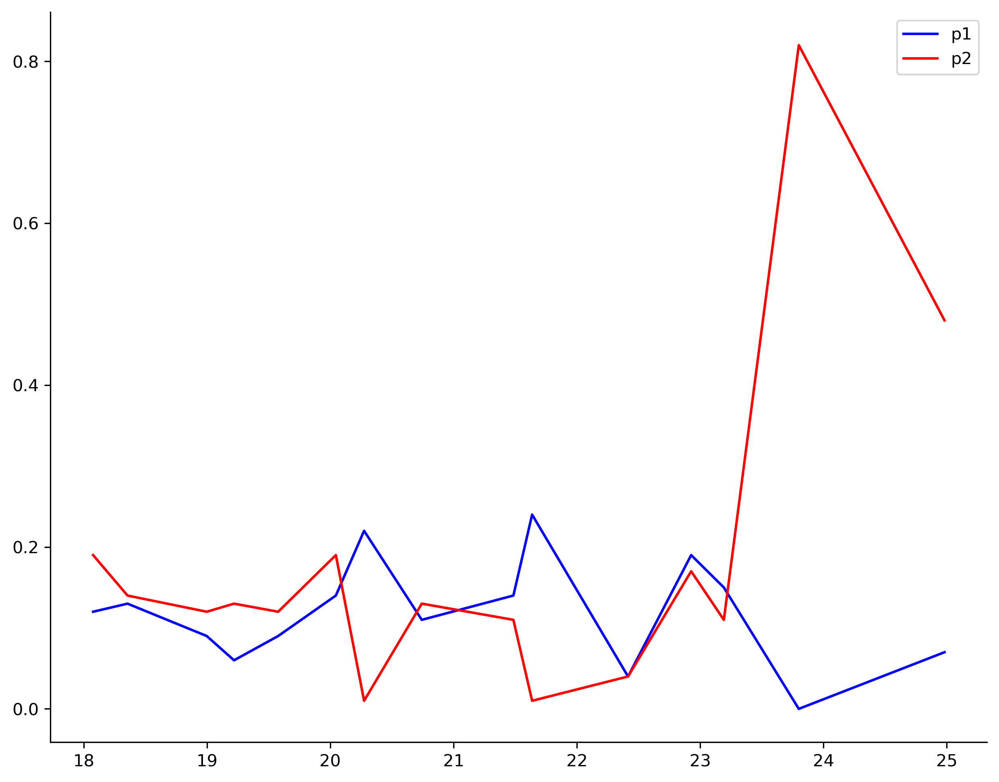

In [28]:
plt.figure(figsize=(10, 8),dpi=300)
ddf = p_df
# sns.boxplot(x='peak',y='value',data=ddf, hue='type')
# sns.stripplot(x='peak',y='value',hue='type',jitter=True,data=ddf,color='.25',dodge=True)
# sns.swarmplot(x='peak',y='value',hue='type',data=ddf,dodge=True)
ddf1 = ddf[ddf['type']=='p1']
ddf2 = ddf[ddf['type']=='p2']
plt.plot(ddf1['scan'],ddf1['value'],color='b',label='p1')
plt.plot(ddf2['scan'],ddf2['value'],color='r',label='p2')
plt.legend()
sns.despine()
# plt.ylim(0,300000)
# plt.xlim(0,30)
plt.show()

In [7]:
scans = df.scan.unique()
scans

array([18.076, 18.355, 18.998, 19.219, 19.577, 20.045, 20.274, 20.742,
       21.485, 21.637, 22.415, 22.927, 23.192, 23.8  , 24.982])

In [8]:
df

,mz,inten,charge,H,Na,com,group,limit,C_Na,S_Na,scan,ismax,weight
0,575.96602,9.285062e+07,2,2,0,"dA[1,2,0,6]",1,8,2,6,18.076,1,0.000000e+00
1,586.95628,1.062081e+08,2,3,1,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.062081e+08
2,597.94706,6.898725e+07,2,4,2,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.379745e+08
3,608.93831,4.418838e+07,2,5,3,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.325651e+08
4,619.92924,2.997720e+07,2,6,4,"dA[1,2,0,6]",1,8,2,6,18.076,1,1.199088e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...
747,651.75748,1.119407e+06,4,7,3,"[5,5,1,10]",117,15,5,10,24.982,0,3.358220e+06
748,679.25897,1.666865e+06,4,12,8,"[5,5,1,10]",117,15,5,10,24.982,0,1.333492e+07
749,684.74214,3.812812e+06,4,13,9,"[5,5,1,10]",117,15,5,10,24.982,0,3.431531e+07
750,690.23991,6.945432e+05,4,14,10,"[5,5,1,10]",117,15,5,10,24.982,0,6.945432e+06


In [19]:
def get_exp_the_sp(one_df,p1,p2):
    group =one_df.group.unique()
    y_real = []
    y_the = []
    mz_list = []
    for n in group:
        tmp_df = df[df['group']==n]
        tmp_df.index = range(tmp_df.shape[0])
        x = np.array(tmp_df['Na'])
        lim = tmp_df.loc[0,'limit']
        N_c = tmp_df.loc[0,'C_Na']
        com = tmp_df.loc[0,'com']
        ori_mz = tmp_df.loc[0,'mz']
        ori_na = tmp_df.loc[0,'Na']
        ori_charge = tmp_df.loc[0,'charge']
        one_y_real = []
        one_y_the = []
        one_mz_list = []
        Na_uni = tmp_df['Na'].unique()
        for i in range(lim+1):
            tmp_x = i
            if i not in Na_uni:
                one_y_real.append(0)
                diff = (i - ori_na)*(22/ori_charge)
                one_mz_list.append(ori_mz+diff)
            else:
                tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
                tmp_mz = np.array(tmp_df[tmp_df['Na']==tmp_x]['mz'])[0]
                one_y_real.append(tmp_real)
                one_mz_list.append(tmp_mz)
        max_ind = np.argmax(one_y_real)
        max_int = np.max(one_y_real)               
        pears,one_y_the = get_pear(p1,p2,lim, N_c, one_y_real)
        max_pro = one_y_the[max_ind]
        if max_pro <=0.001:
            # print('group ',n)
            # print('y_exp ',one_y_real)
            # print('max_ind ', max_ind)
            # print('y_the ',one_y_the)
            max_pro = 0.001
        one_y_the = [x*max_int/max_pro for x in one_y_the]
        y_real.extend(one_y_real)
        y_the.extend(one_y_the)
        mz_list.extend(one_mz_list)
    return mz_list, y_real, y_the
        
        

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

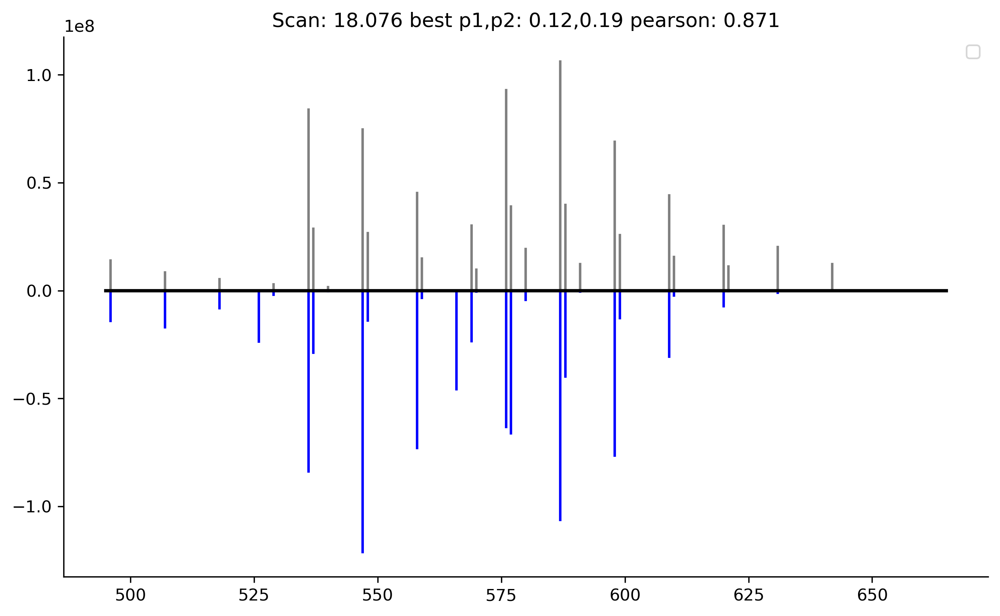

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

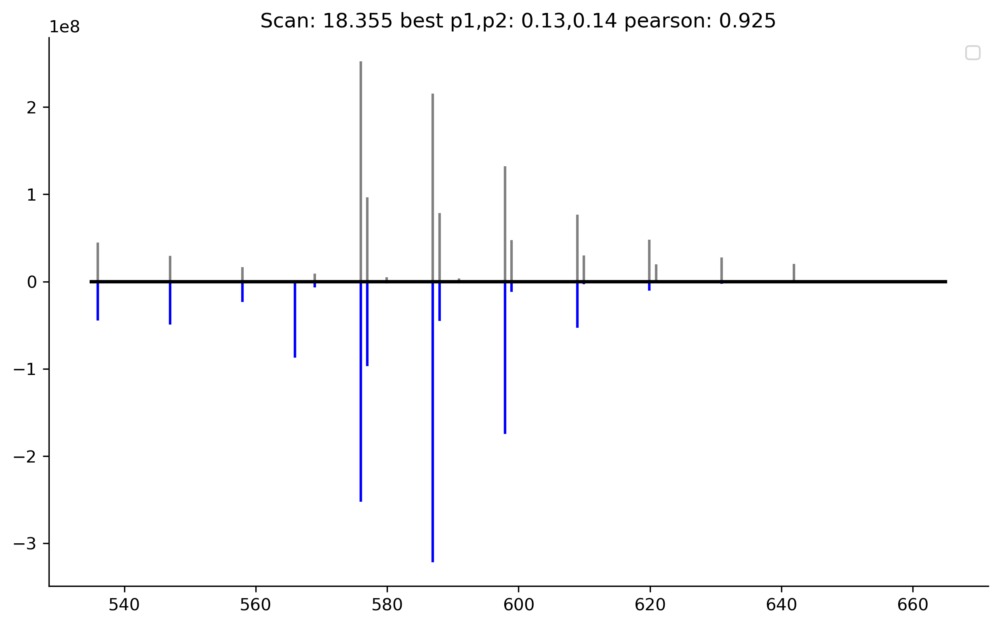

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

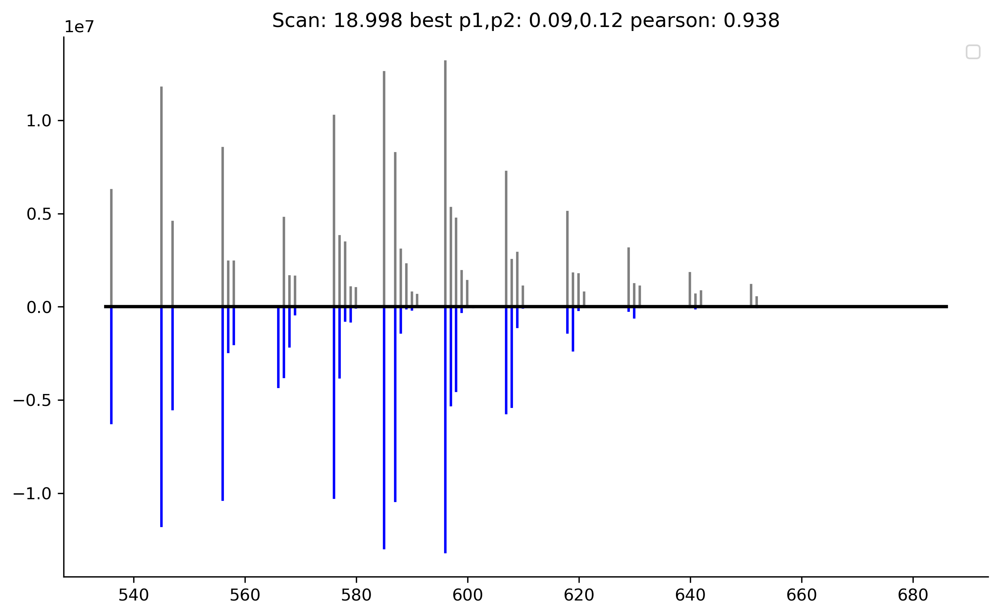

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

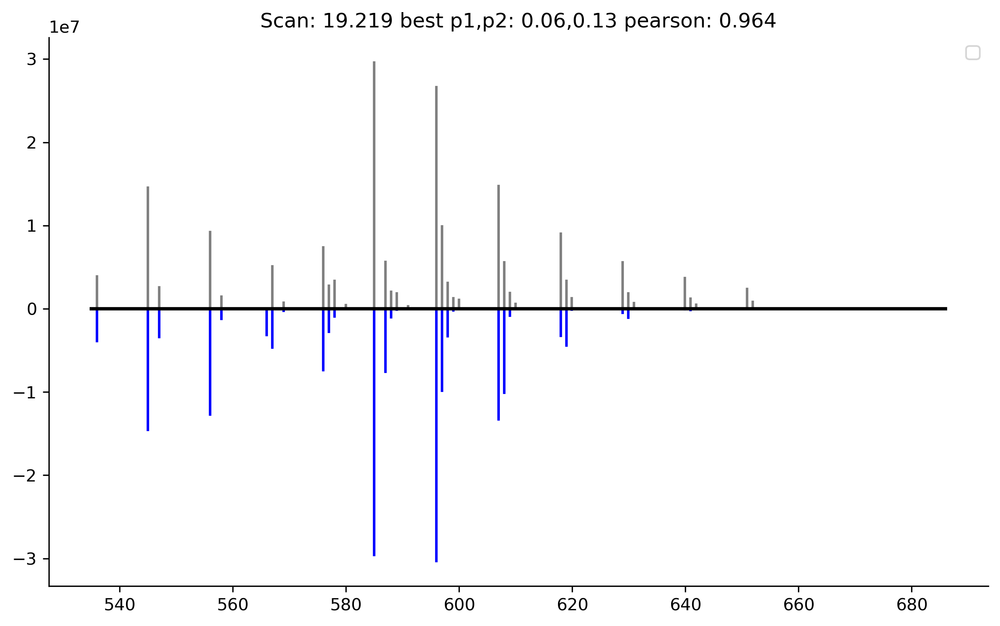

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

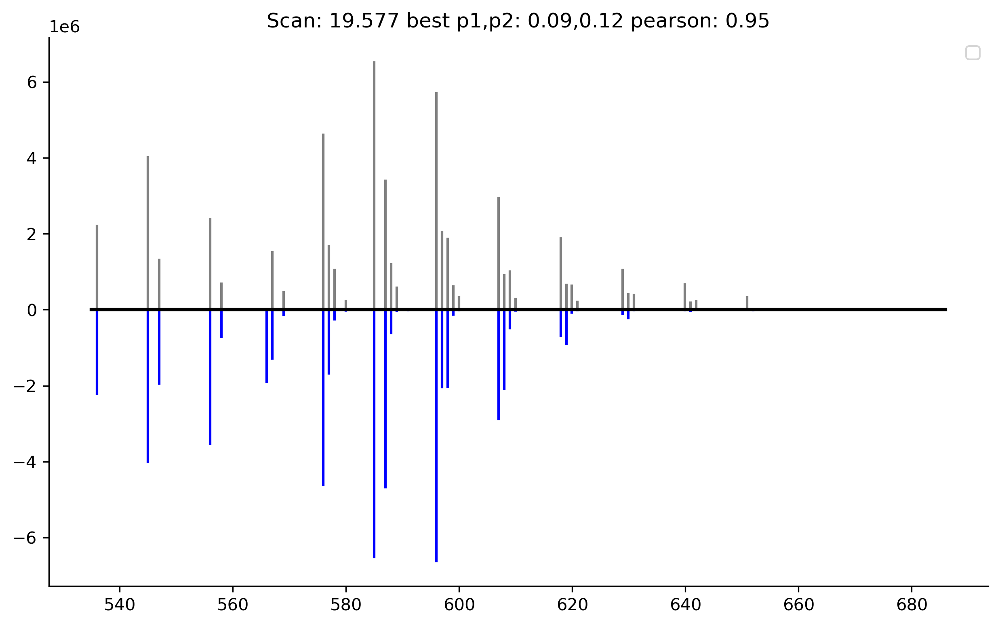

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

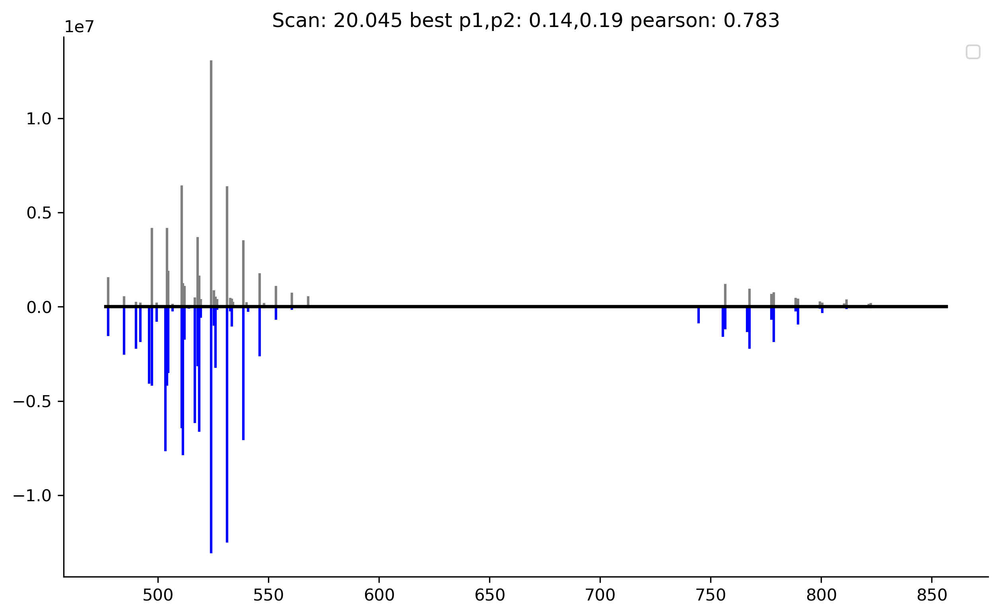

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

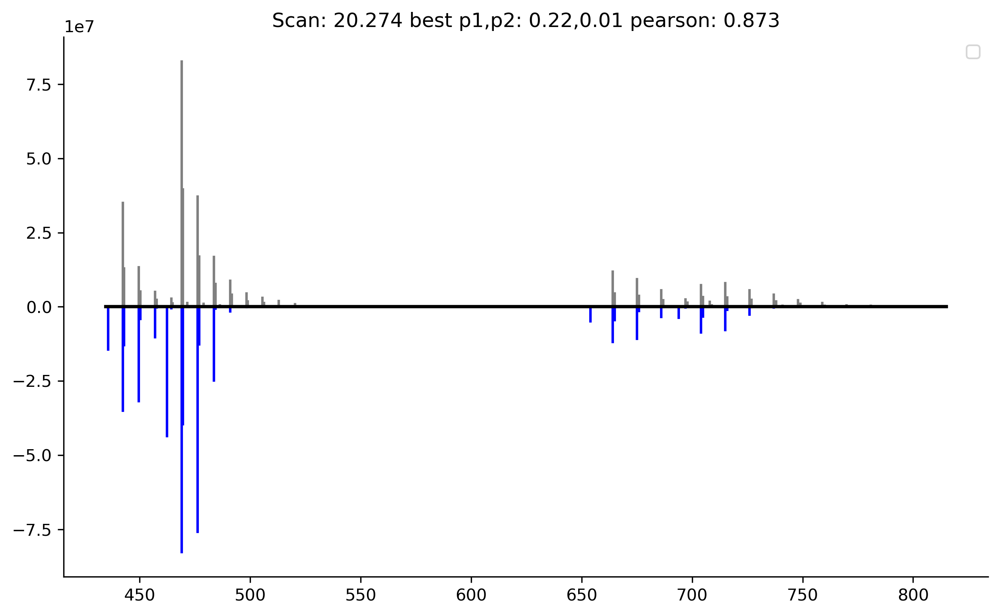

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

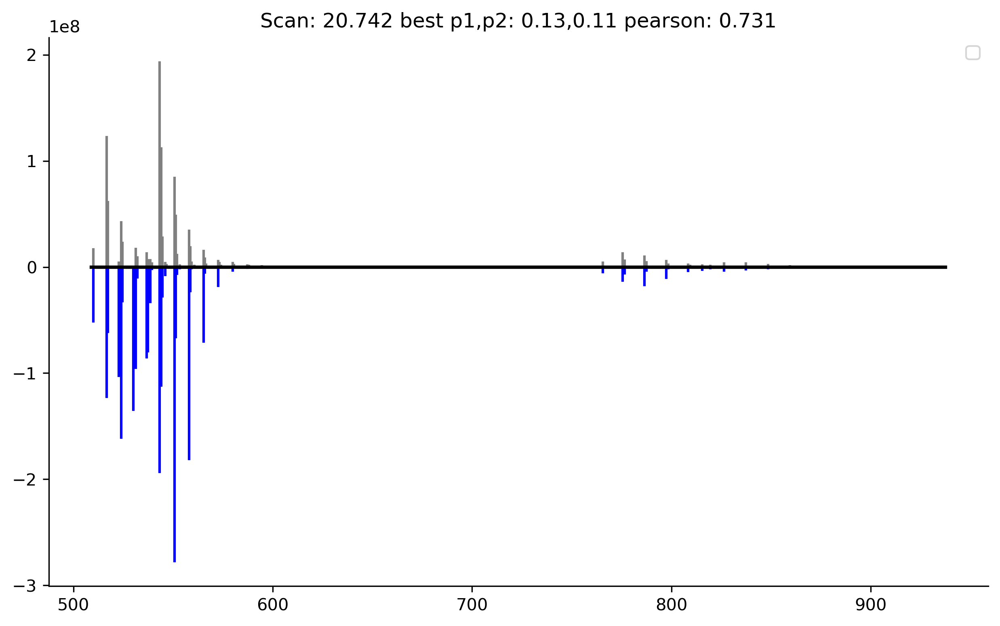

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

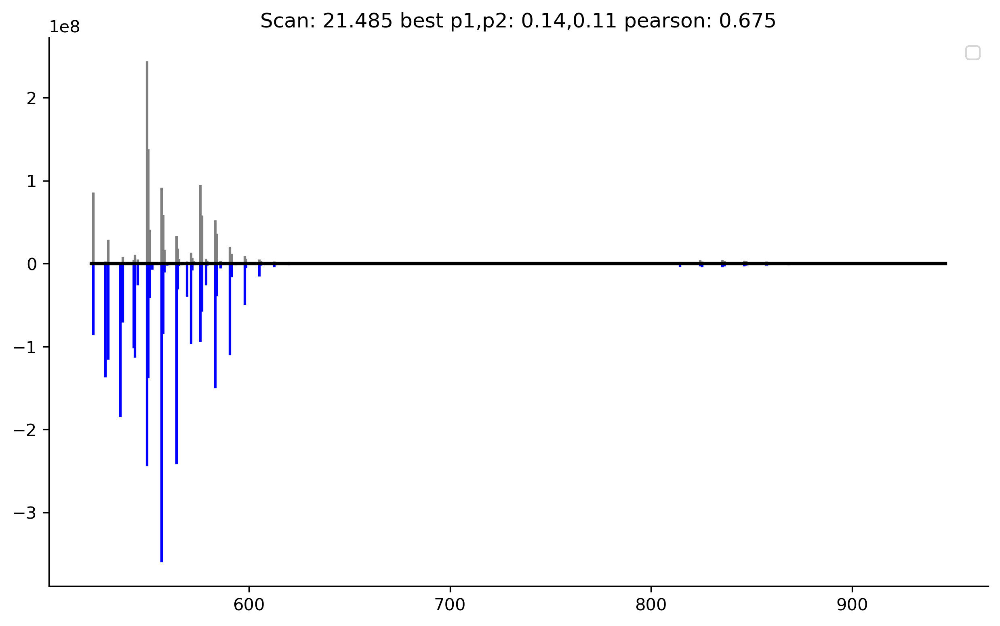

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

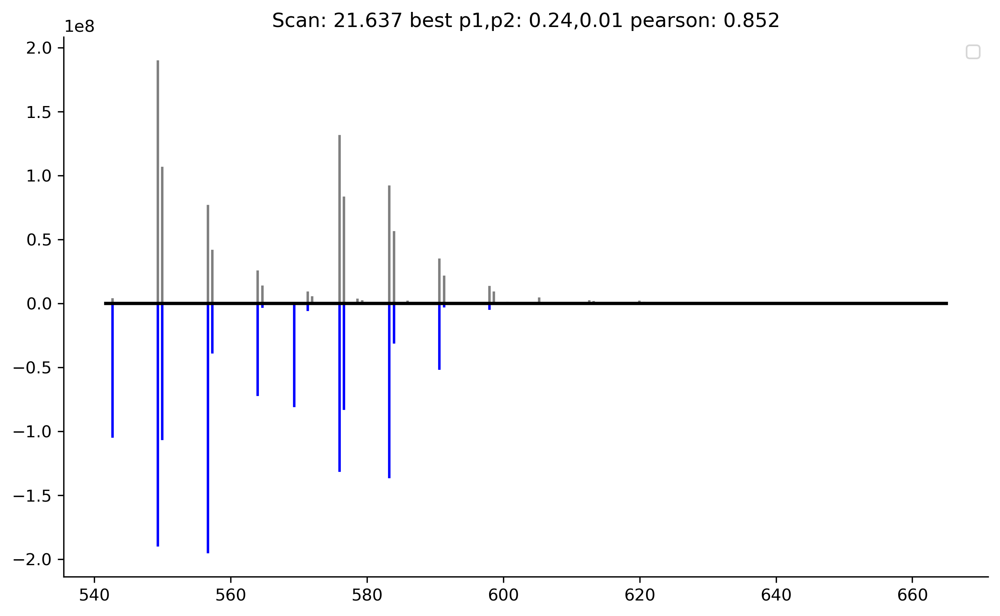

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

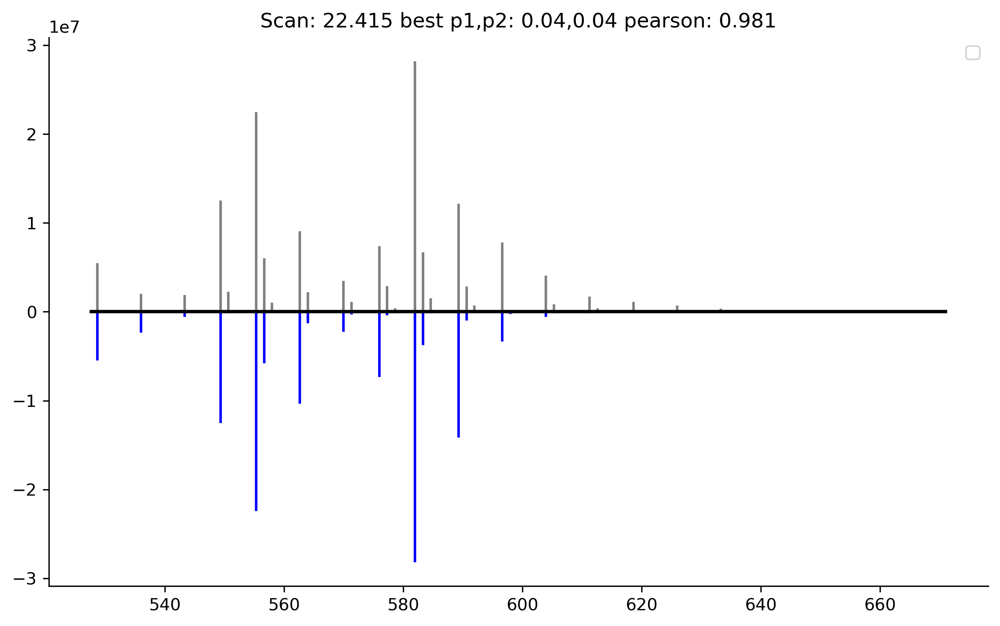

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

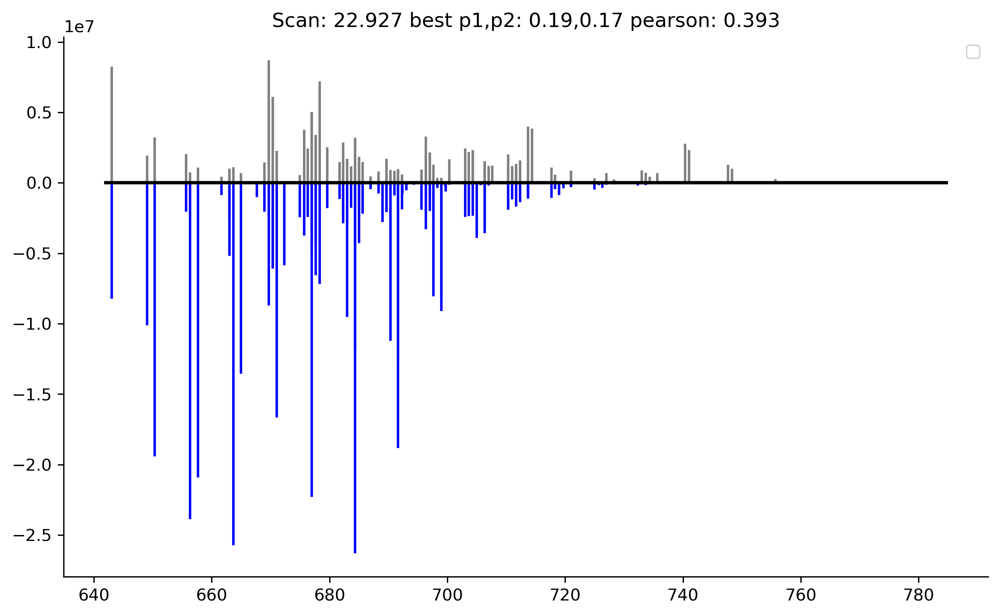

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

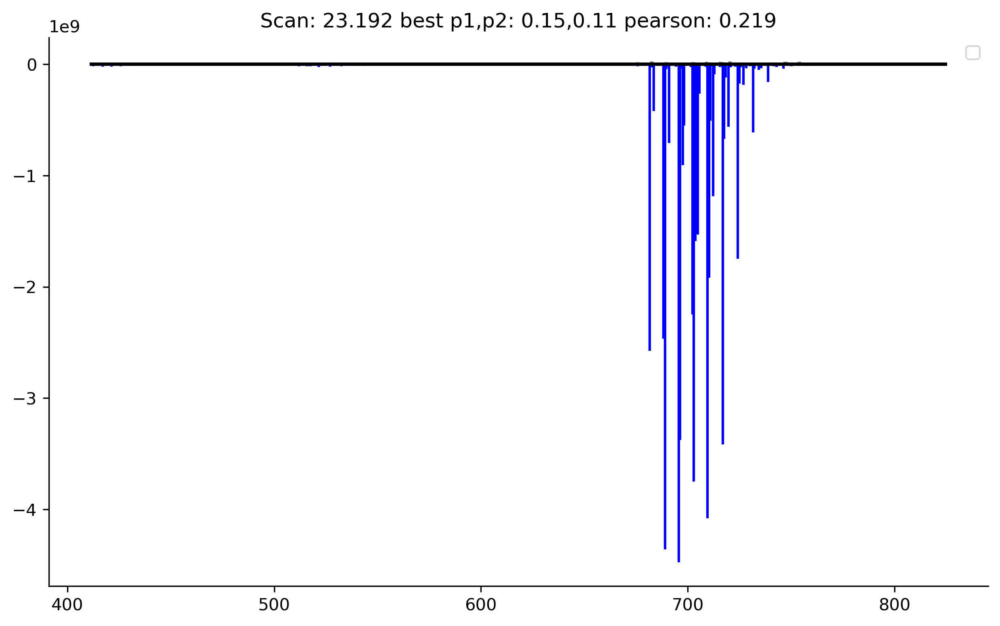

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

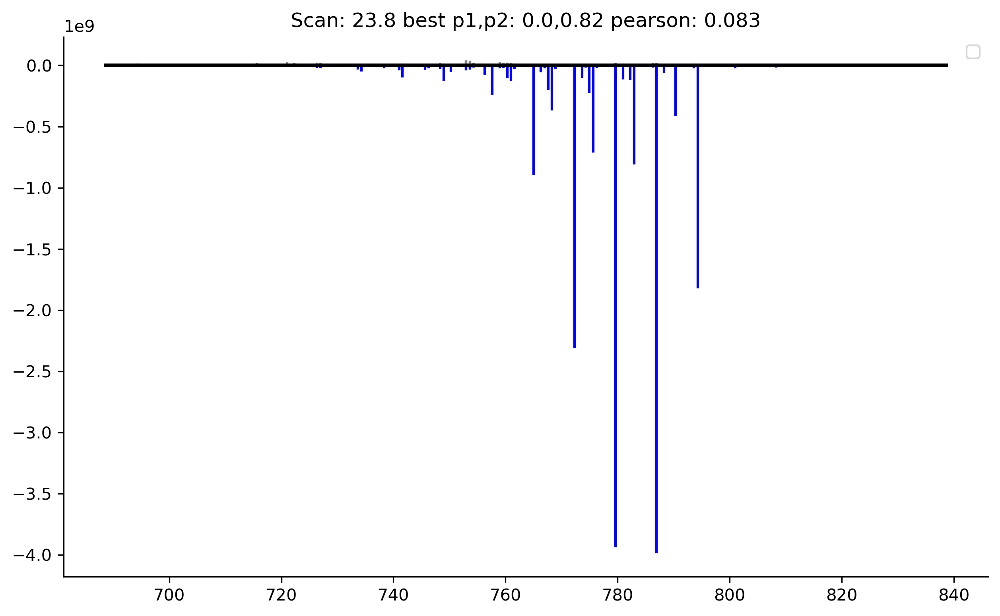

No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

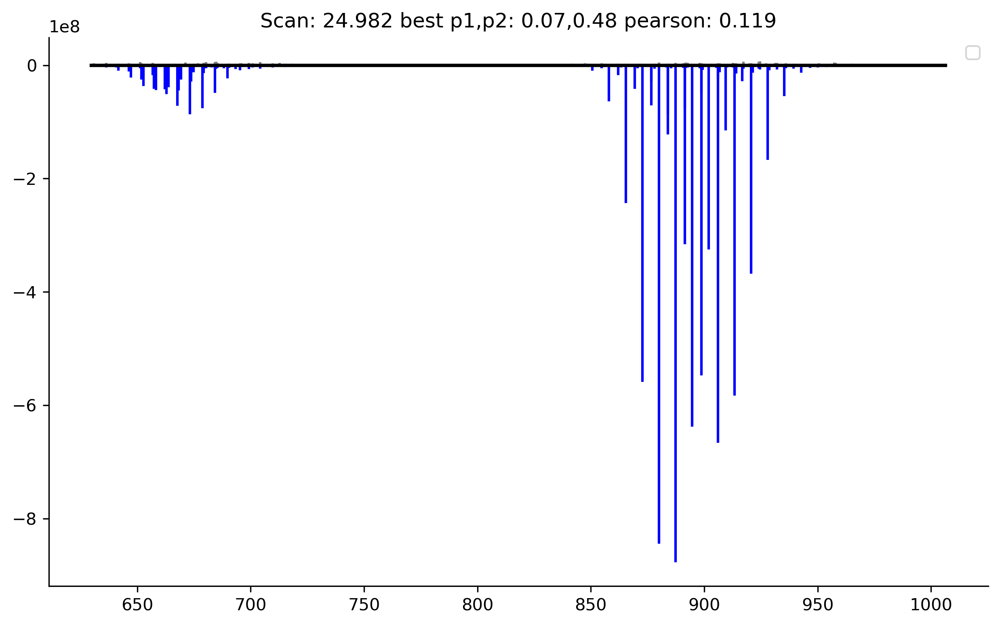

In [20]:
best_p = []
for scan in scans:
    one_df = df[df['scan']==scan]
    group =one_df.group.unique()
    best_pear =0
    best_p1 = 0
    best_p2 = 0
    df_draw= []
    for p1 in np.arange(0,0.91,0.01):
        for p2 in np.arange(0,0.91,0.01):
            mz_list,y_real, y_the = get_exp_the_sp(one_df,p1,p2)
            the_df = pd.DataFrame(np.array([mz_list,y_real,y_the]).T, columns=['mz','y_exp','y_the'])
            pears,_=stats.pearsonr(y_real,y_the)
            if pears > best_pear:
                best_pear = pears
                best_p1 = p1
                best_p2 = p2
                df_draw = the_df
    best_p.append([best_p1,'p1', scan])
    best_p.append([best_p2,'p2', scan])
    plt.clf()
    plt.figure(figsize=(10, 6),dpi=300)
    for i in range(df_draw.shape[0]):
        mz = df_draw.loc[i,'mz']
        y_exp = df_draw.loc[i,'y_exp']
        y_the = df_draw.loc[i,'y_the']
        plt.plot([mz,mz],[0,y_exp], c='grey')
        plt.plot([mz,mz],[0,-y_the], c='b')
    plt.plot([np.min(df_draw['mz'])-1,np.max(df_draw['mz'])+1],[0,0],lw =2, c = 'k')
    sns.despine()
    plt.title('Scan: '+str(scan)+ ' best p1,p2: '+str(np.round(best_p1,2))+','+str(np.round(best_p2,2))+str(' pearson: ')+str(np.round(best_pear,3)))
    plt.legend()
    plt.show()




## Na validation of scan dp8 

In [6]:
scan_num = range(3288,3310)
dir = './result/Luna_HILIC/'
df_all = pd.DataFrame()

for scan in scan_num:
    fname = str(scan)+'_ppm50_Na.xlsx'
    df_scan = pd.read_excel(dir+fname,sheet_name=0)
    df_scan['scan'] = scan
    df_all = pd.concat([df_all, df_scan], axis=0)

df_all.index = range(df_all.shape[0])
df_all.columns = ['mz','int','charge','H','Na','the_mz','mass','order','comp','lost','scan']
df_all

,mz,int,charge,H,Na,the_mz,mass,order,comp,lost,scan
0,400.99046,2.471725e+05,5,6,1,401.0023,1988.05880,1,"dA[3,4,0,8]","[0, 0, 0, 0]",3288
1,401.40581,2.905968e+06,5,5,0,401.4043,2012.05880,1,"dA[3,3,1,8]aG","[0, 0, 0, 0]",3288
2,401.80570,2.564285e+06,5,6,1,401.8152,1992.12313,1,"dA[3,4,2,7]","[0, 0, 0, 0]",3288
3,401.80570,2.564285e+06,5,7,2,401.7981,1970.04822,1,"dA[3,3,0,8]aG","[0, 0, 0, 0]",3288
4,402.20642,8.271162e+05,5,8,3,402.2090,1950.11255,1,"dA[3,4,1,7]","[0, 0, 0, 0]",3288
...,...,...,...,...,...,...,...,...,...,...,...
5147,749.65359,3.674148e+05,3,12,9,749.6516,2054.06938,1,"dA[3,3,2,8]aG","[0, 0, 0, 0]",3309
5148,750.97112,3.864868e+05,3,6,3,750.9766,2189.98304,1,"dA[3,4,1,10]","[0, 0, 0, 0]",3309
5149,753.67937,1.888959e+05,3,7,4,753.6578,2176.03679,1,"dA[3,3,3,9]aG","[0, 0, 0, 0]",3309
5150,754.34389,1.880560e+05,3,11,8,754.3287,2090.09054,1,"[4,4,2,8]","[0, 0, 0, 0]",3309


In [9]:
comp_list = ['dA[3,3,1,8]aG','[4,4,1,8]','[4,4,0,8]','dA[3,4,2,7]','dA[3,3,0,8]aG','dA[3,3,1,7]aG',
'dA[3,4,1,7]','dA[3,4,1,8]','dA[3,4,2,8]','dA[3,4,3,7]','dA[3,4,0,8]','dA[3,4,0,9]']

In [8]:
df_all_3 = df_all[df_all['charge']==3]
df_all_3

,mz,int,charge,H,Na,the_mz,mass,order,comp,lost,scan
60,616.37669,3.477068e+06,3,3,0,616.3742,1852.14514,1,"dA[3,3,1,6]aG","[0, 0, 0, 0]",3288
61,617.04329,2.074978e+06,3,5,2,617.0305,1810.13456,1,"dA[3,3,0,6]aG","[0, 0, 0, 0]",3288
62,622.37973,2.911080e+05,3,3,0,622.3777,1870.15572,1,"dA[3,4,1,6]","[0, 0, 0, 0]",3288
63,623.01603,9.576819e+05,3,5,2,623.0341,1828.14514,1,"dA[3,4,0,6]","[0, 0, 0, 0]",3288
64,623.70324,9.411312e+05,3,4,1,623.7041,1852.14514,1,"dA[3,3,1,6]aG","[0, 0, 0, 0]",3288
...,...,...,...,...,...,...,...,...,...,...,...
5147,749.65359,3.674148e+05,3,12,9,749.6516,2054.06938,1,"dA[3,3,2,8]aG","[0, 0, 0, 0]",3309
5148,750.97112,3.864868e+05,3,6,3,750.9766,2189.98304,1,"dA[3,4,1,10]","[0, 0, 0, 0]",3309
5149,753.67937,1.888959e+05,3,7,4,753.6578,2176.03679,1,"dA[3,3,3,9]aG","[0, 0, 0, 0]",3309
5150,754.34389,1.880560e+05,3,11,8,754.3287,2090.09054,1,"[4,4,2,8]","[0, 0, 0, 0]",3309


In [ ]:
fig, axs = plt.subplots(24,5,figsize=(20, 60),dpi=300)
p_result = []
for n in group:
    tmp_df = df[df['group']==n]
    tmp_df.index = range(tmp_df.shape[0])
    x = np.array(tmp_df['Na'])
    lim = tmp_df.loc[0,'limit']
    N_c = tmp_df.loc[0,'C_Na']
    com = tmp_df.loc[0,'com']
    scan = tmp_df.loc[0,'scan']
    is_max = np.max(tmp_df.loc[:,'ismax'])
    y_real = []
    y_the = []
    Na_uni = tmp_df['Na'].unique()
    for i in range(lim+1):
        tmp_x = i
        if i not in Na_uni:
            y_real.append(0)
        else:
            tmp_real=np.array(tmp_df[tmp_df['Na']==tmp_x]['inten'])[0]
            y_real.append(tmp_real)
    p1,p2,pears,y_the = find_best_p(lim, N_c, y_real)
    if is_max>=1:
        p_result.append([p1,'p1',scan])
        p_result.append([p2,'p2',scan])
    max_real = np.max(y_real)
    max_the = np.max(y_the)
    y_real =np.array(y_real)/max_real*100
    y_the = np.array(y_the)/max_the*100
    tmp_JS = np.round(get_JS(y_real,y_the),5)
    # tmp_per = np.round(stats.pearsonr(y_real,y_the),4)
    # plt.figure(figsize=(8,6),dpi=300)
    lw1 = 2
    lw2 = 1
    a1 = (n-1)//5
    a2 = (n-1)%5
    for i in range(lim+1):
        xx = i
        y1 = y_real[i]
        y2 = y_the[i]
        axs[a1,a2].plot([xx,xx],[0,y1], lw=lw1, c='grey', zorder=1)
        axs[a1,a2].plot([xx,xx],[0,-y2], lw=lw2, c='b', zorder=2)
    sns.despine()
    axs[a1,a2].plot([0,lim+1],[0,0],lw =2, c = 'k')
    axs[a1,a2].plot([0,0],[0,0],lw=lw1, c='grey',label='Exp_sp')
    axs[a1,a2].plot([0,0],[0,0],lw=lw2, c='b',label='The_sp')
    axs[a1,a2].set_title(str(com)+', pc='+str(np.round(pears,3))+', p1,p2='+str(np.round(p1,2))+', '+str(np.round(p2,2)))
    axs[a1,a2].legend(frameon =False)
plt.tight_layout(pad=0.9) 
plt.show()

<Figure size 432x288 with 0 Axes>

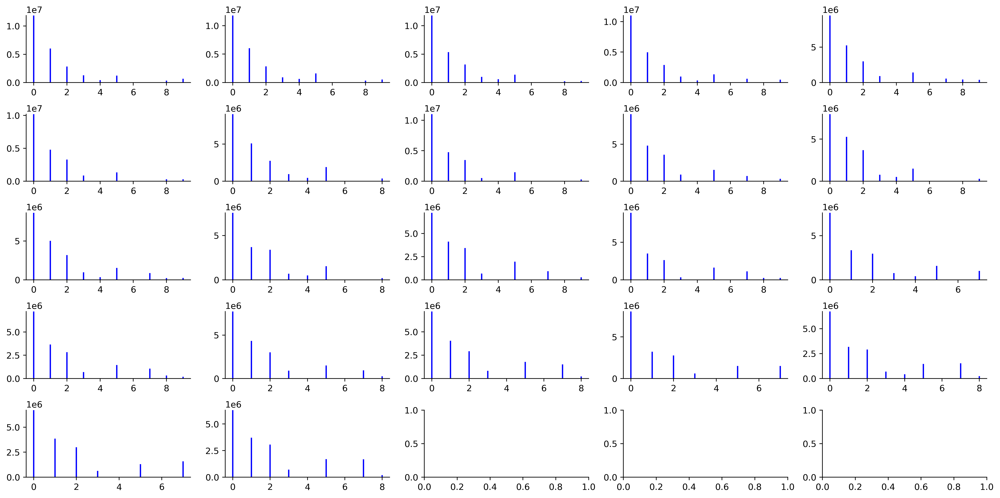

<Figure size 432x288 with 0 Axes>

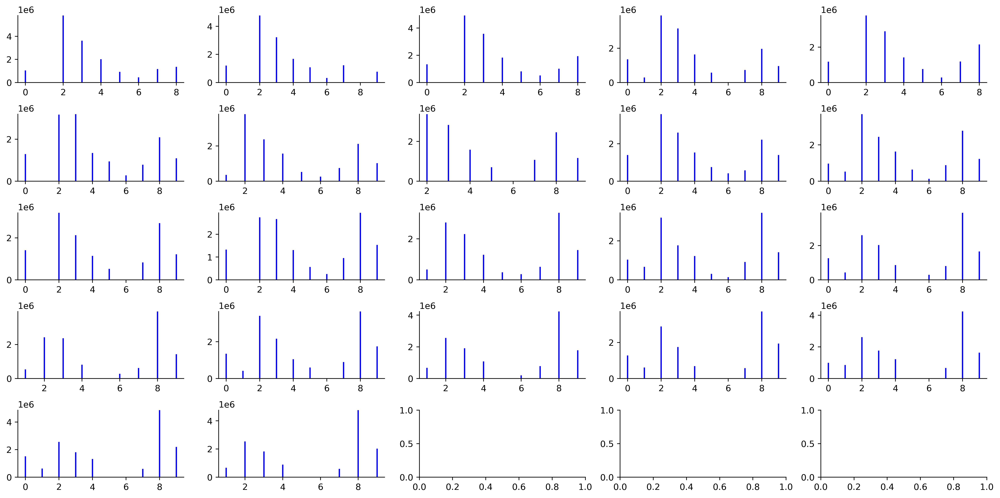

<Figure size 432x288 with 0 Axes>

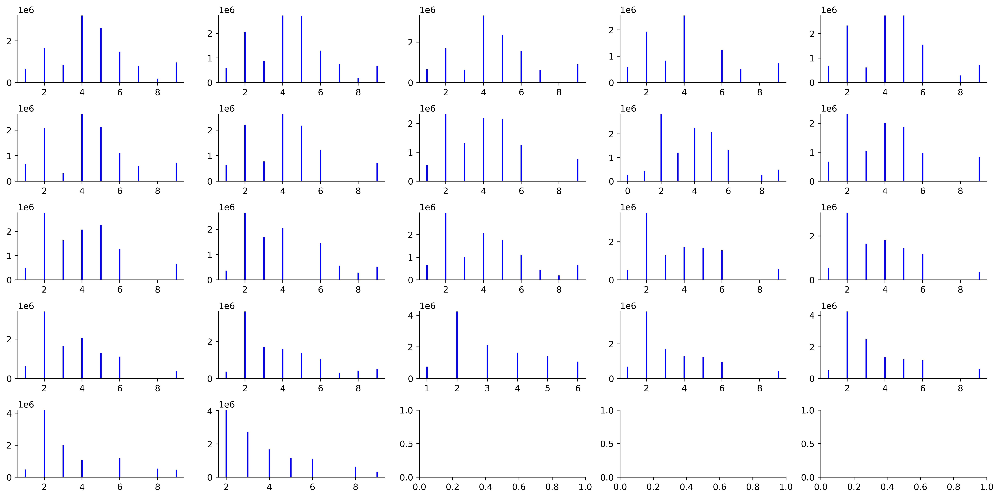

<Figure size 432x288 with 0 Axes>

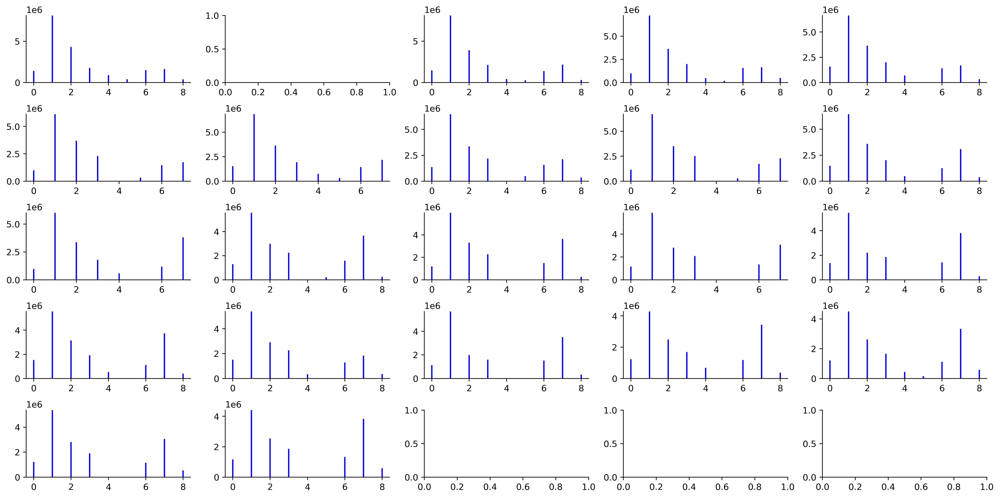

<Figure size 432x288 with 0 Axes>

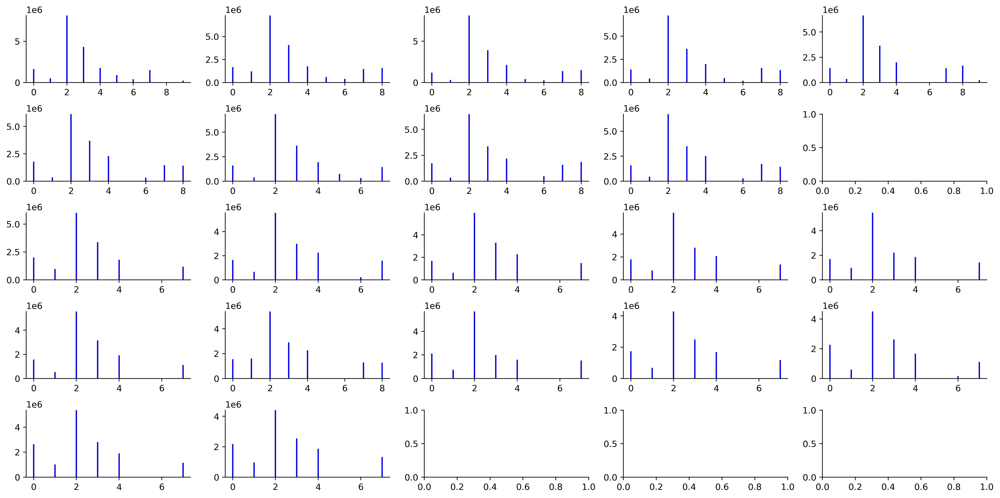

<Figure size 432x288 with 0 Axes>

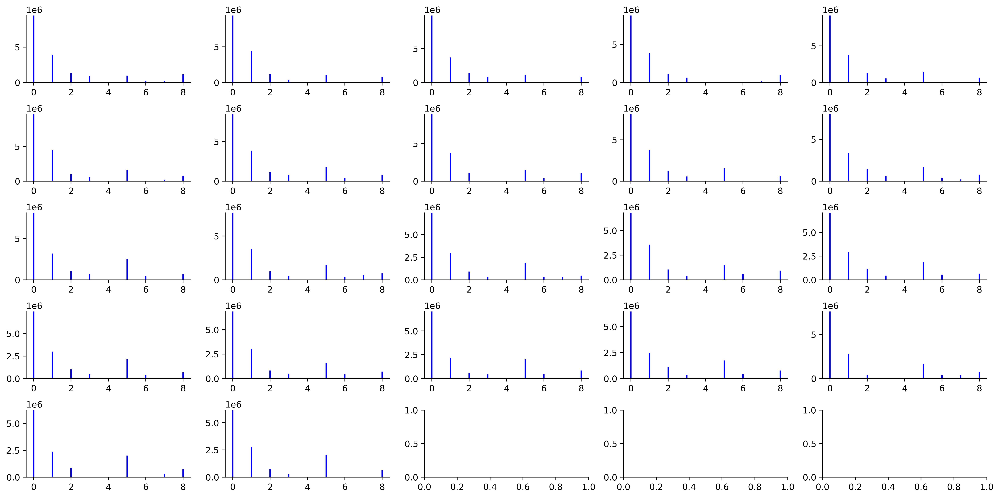

<Figure size 432x288 with 0 Axes>

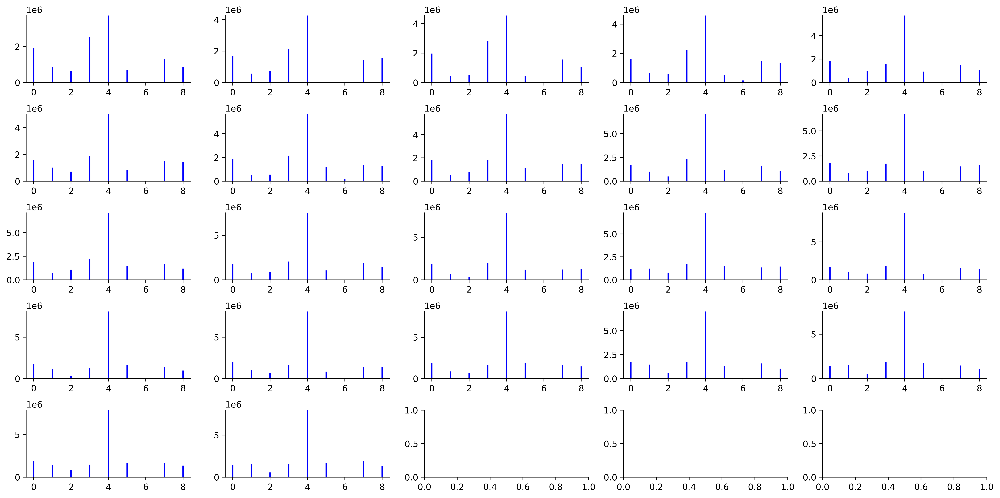

<Figure size 432x288 with 0 Axes>

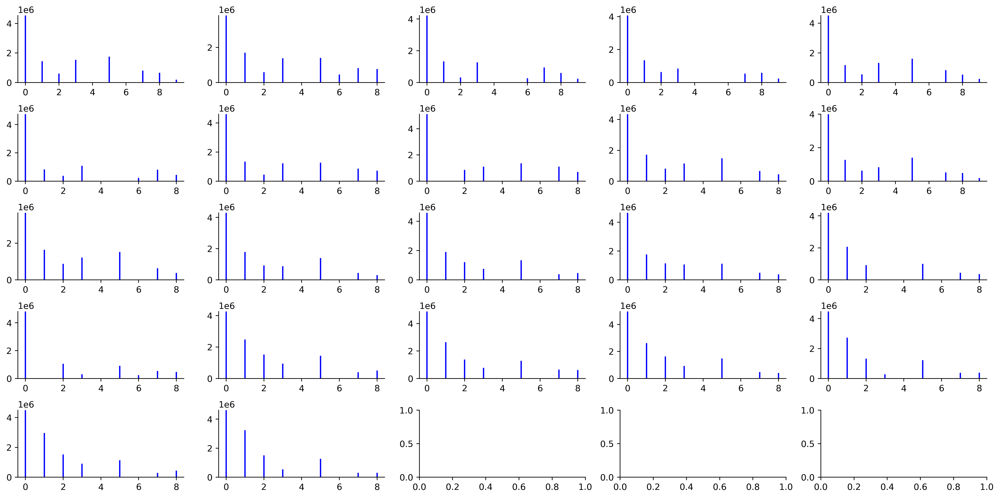

<Figure size 432x288 with 0 Axes>

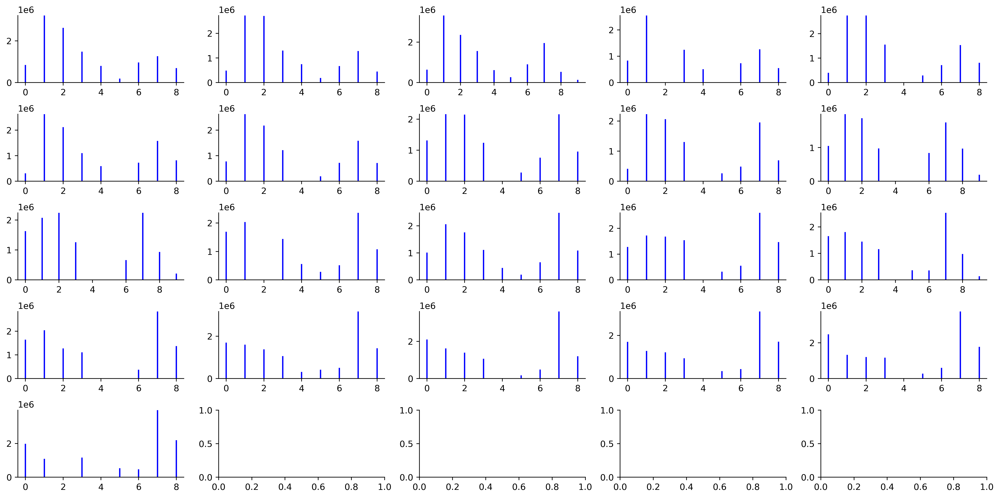

<Figure size 432x288 with 0 Axes>

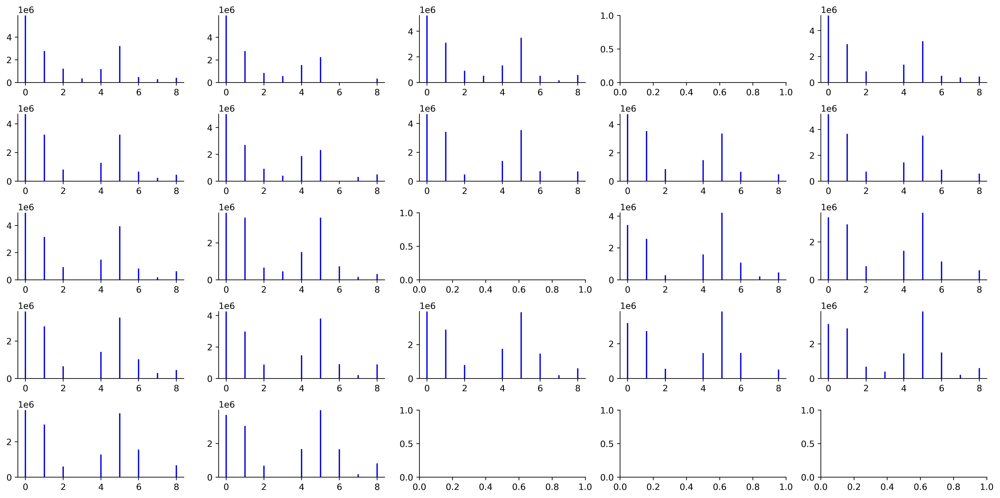

<Figure size 432x288 with 0 Axes>

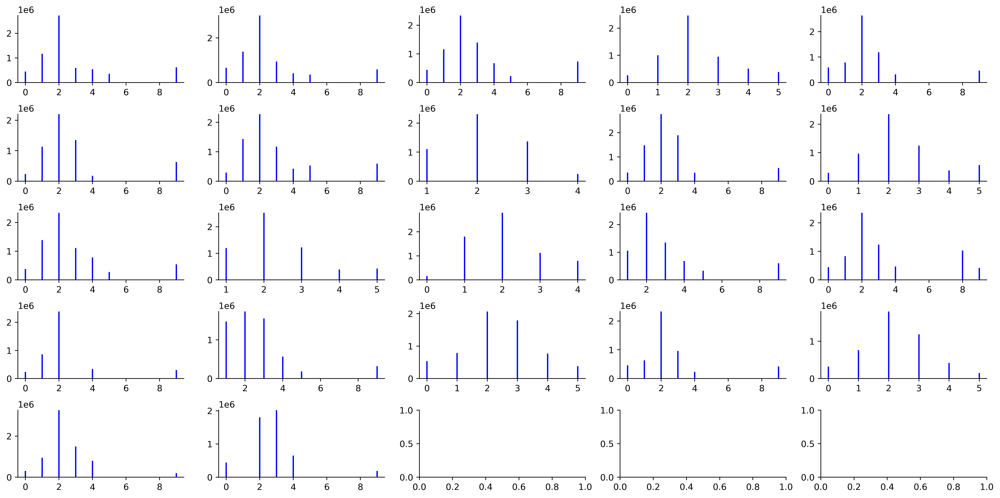

<Figure size 432x288 with 0 Axes>

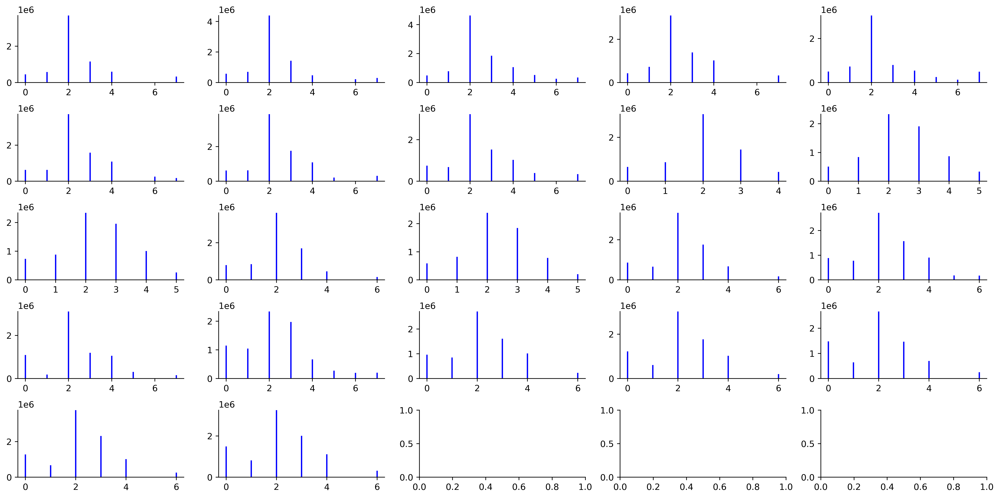

In [17]:
for comp in comp_list:
    plt.clf()
    tmp_df = df_all_3[df_all_3['comp']==comp]
    fig, axs = plt.subplots(5,5,figsize=(16, 8),dpi=400)
    for i in range(len(scan_num)):
        scan = scan_num[i]
        one_df = tmp_df[tmp_df['scan']==scan]
        one_df.index = range(one_df.shape[0])
        a1 = (i)//5
        a2 = (i)%5
        for n in range(one_df.shape[0]):
            xx =one_df.loc[n,'Na']
            y1 = one_df.loc[n,'int']
            axs[a1,a2].plot([xx,xx],[0,y1], c='blue', zorder=1)
        if one_df.shape[0]<=0:
            axs[a1,a2].set_ylim([0, 1])
        else:
            axs[a1,a2].set_ylim([0, np.max(one_df['int'])])
        sns.despine()
    plt.tight_layout(pad=0.9) 
    plt.show()
